# Finance Data Project 

In this data project we will focus on exploratory data analysis of stock prices. Keep in mind, this project is just meant to practice your visualization and pandas skills, it is not meant to be a robust financial analysis or be taken as financial advice.

We'll focus on bank stocks and see how they progressed throughout the 
[financial crisis](https://en.wikipedia.org/wiki/Financial_crisis_of_2007%E2%80%9308) all the way to early 2016.

## Get the Data

In this section we will learn how to use pandas to directly read data from Google finance using pandas!

First we need to start with the proper imports.

*Note: [You'll need to install pandas-datareader for this to work!](Pandas datareader allows you to [read stock information directly from the internet](http://pandas.pydata.org/pandas-docs/stable/remote_data.html) Use these links for install guidance (**pip install pandas-datareader**)


In [7]:
from pandas_datareader import data, wb
import pandas_datareader.data as web
import pandas as pd
import numpy as np
import datetime
import seaborn as sns

%matplotlib inline

## Data

We need to get data using pandas datareader. We will get stock information for the following banks:
*  Bank of America
* CitiGroup
* Goldman Sachs
* JPMorgan Chase
* Morgan Stanley
* Wells Fargo

** Figure out how to get the stock data from Jan 1st 2006 to Jan 1st 2016 for each of these banks. Set each bank to be a separate dataframe, with the variable name for that bank being its ticker symbol. This will involve a few steps:**
1. Use datetime to set start and end datetime objects.
2. Figure out the ticker symbol for each bank.
2. Figure out how to use datareader to grab info on the stock.

** Use [this documentation page](http://pandas.pydata.org/pandas-docs/stable/remote_data.html) for hints and instructions (it should just be a matter of replacing certain values. Use google finance as a source, for example:**
    
    # Bank of America
    BAC = data.DataReader("BAC", 'google', start, end)


In [8]:
start = datetime.datetime(2006,1,1)
end = datetime.datetime(2016,1,1)

In [9]:
#bank of america
BAC = data.DataReader('BAC','yahoo', start, end)

#citigroup
C = data.DataReader('C','yahoo', start, end)

#Goldman sachs
GS = data.DataReader('GS','yahoo', start, end)

#JPMorgan Chase
JPM = data.DataReader('JPM','yahoo', start, end)

#Morgan Stanley
MS = data.DataReader('MS','yahoo',start, end)

#Wells Fargo
WFC = data.DataReader('WFC','yahoo', start, end)

In [10]:
#MS
#BAC
#C
#GS
#JPM
#WFC

** Create a list of the ticker symbols (as strings) in alphabetical order. Call this list: tickers**

In [11]:
tickers = ['BAC','C','GS','JPM','MS','WFC']

** Use pd.concat to concatenate the bank dataframes together to a single data frame called bank_stocks. Set the keys argument equal to the tickers list. Also pay attention to what axis you concatenate on.**

In [15]:
bank_stocks = pd.concat([BAC,C,GS,JPM,MS,WFC], axis=1, keys=tickers)
bank_stocks.head()


BAC                                                          \
                 High        Low       Open      Close      Volume  Adj Close   
Date                                                                            
2006-01-03  47.180000  46.150002  46.919998  47.080002  16296700.0  36.332104   
2006-01-04  47.240002  46.450001  47.000000  46.580002  17757900.0  35.946239   
2006-01-05  46.830002  46.320000  46.580002  46.639999  14970700.0  35.992565   
2006-01-06  46.910000  46.349998  46.799999  46.570000  12599800.0  35.938522   
2006-01-09  46.970001  46.360001  46.720001  46.599998  15619400.0  35.961674   

                     C                                        ...      \
                  High         Low        Open       Close    ...       
Date                                                          ...       
2006-01-03  493.799988  481.100006  490.000000  492.899994    ...       
2006-01-04  491.000000  483.500000  488.600006  483.799988    ...       
2006-01-05  487.799988  484.000000  484.399994  486.200012    ...       
2006-01-06  489.000000  482.000000  488.799988  486.200012    ...       
2006-01-09  487.399994  483.000000  486.000000  483.899994    ...       

                   MS                                         WFC             \
                 Open      Close     Volume  Adj Close       High        Low   
Date                                                                           
2006-01-03  57.169998  58.310001  5377000.0  39.110695  31.975000  31.195000   
2006-01-04  58.700001  58.349998  7977800.0  39.137527  31.820000  31.365000   
2006-01-05  58.549999  58.509998  5778000.0  39.244846  31.555000  31.309999   
2006-01-06  58.770000  58.570000  6889800.0  39.285095  31.775000  31.385000   
2006-01-09  58.630001  59.189999  4144500.0  39.700924  31.825001  31.555000   

                                                         
                 Open      Close      Volume  Adj Close  
Date                                                     
2006-01-03  31.600000  31.900000  11016400.0  21.890329  
2006-01-04  31.799999  31.530001  10870000.0  21.636433  
2006-01-05  31.500000  31.495001  10158000.0  21.612413  
2006-01-06  31.580000  31.680000   8403800.0  21.739365  
2006-01-09  31.674999  31.674999   5619600.0  21.735937  

[5 rows x 36 columns]

In [53]:
bank_stocks.columns.names = ['Bank Ticker','Stock Info']

** Check the head of the bank_stocks dataframe.**

In [56]:
bank_stocks.head()

Bank Ticker        BAC                                               \
Stock Info        High        Low       Open      Close      Volume   
Date                                                                  
2006-01-03   47.180000  46.150002  46.919998  47.080002  16296700.0   
2006-01-04   47.240002  46.450001  47.000000  46.580002  17757900.0   
2006-01-05   46.830002  46.320000  46.580002  46.639999  14970700.0   
2006-01-06   46.910000  46.349998  46.799999  46.570000  12599800.0   
2006-01-09   46.970001  46.360001  46.720001  46.599998  15619400.0   

Bank Ticker                      C                                      \
Stock Info   Adj Close        High         Low        Open       Close   
Date                                                                     
2006-01-03   36.332104  493.799988  481.100006  490.000000  492.899994   
2006-01-04   35.946239  491.000000  483.500000  488.600006  483.799988   
2006-01-05   35.992565  487.799988  484.000000  484.399994  486.200012   
2006-01-06   35.938522  489.000000  482.000000  488.799988  486.200012   
2006-01-09   35.961674  487.399994  483.000000  486.000000  483.899994   

Bank Ticker    ...             MS                                         WFC  \
Stock Info     ...           Open      Close     Volume  Adj Close       High   
Date           ...                                                              
2006-01-03     ...      57.169998  58.310001  5377000.0  39.110695  31.975000   
2006-01-04     ...      58.700001  58.349998  7977800.0  39.137527  31.820000   
2006-01-05     ...      58.549999  58.509998  5778000.0  39.244846  31.555000   
2006-01-06     ...      58.770000  58.570000  6889800.0  39.285095  31.775000   
2006-01-09     ...      58.630001  59.189999  4144500.0  39.700924  31.825001   

Bank Ticker                                                          
Stock Info         Low       Open      Close      Volume  Adj Close  
Date                                                                 
2006-01-03   31.195000  31.600000  31.900000  11016400.0  21.890329  
2006-01-04   31.365000  31.799999  31.530001  10870000.0  21.636433  
2006-01-05   31.309999  31.500000  31.495001  10158000.0  21.612413  
2006-01-06   31.385000  31.580000  31.680000   8403800.0  21.739365  
2006-01-09   31.555000  31.674999  31.674999   5619600.0  21.735937  

[5 rows x 36 columns]

# EDA

Let's explore the data a bit! Before continuing, I encourage you to check out the documentation on [Multi-Level Indexing](http://pandas.pydata.org/pandas-docs/stable/advanced.html) and [Using .xs](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.xs.html).
Reference the solutions if you can not figure out how to use .xs(), since that will be a major part of this project.

** What is the max Close price for each bank's stock throughout the time period?**

In [16]:
bank_stocks['BAC']['Close'].max()

54.900001525878906

In [21]:
for tick in tickers:
    print(tick,bank_stocks[tick]['Close'].max())

BAC 54.900001525878906
C 564.0999755859375
GS 247.9199981689453
JPM 70.08000183105469
MS 89.30000305175781
WFC 58.52000045776367


In [57]:
#using .xs method
#xs returns the cross section of rows and columns

bank_stocks.xs(key='Close', axis=1, level='Stock Info').max()


Bank Ticker
BAC     54.900002
C      564.099976
GS     247.919998
JPM     70.080002
MS      89.300003
WFC     58.520000
dtype: float64

** Create a new empty DataFrame called returns. This dataframe will contain the returns for each bank's stock. returns are typically defined by:**

$$r_t = \frac{p_t - p_{t-1}}{p_{t-1}} = \frac{p_t}{p_{t-1}} - 1$$

In [34]:
returns = pd.DataFrame()

** We can use pandas pct_change() method on the Close column to create a column representing this return value. Create a for loop that goes and for each Bank Stock Ticker creates this returns column and set's it as a column in the returns DataFrame.**

In [35]:
for tick in tickers:
    returns[tick+' Return'] = bank_stocks[tick]['Close'].pct_change()

In [36]:
returns.head()

,BAC Return,C Return,GS Return,JPM Return,MS Return,WFC Return
Date,,,,,,
2006-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-04,-0.010620,-0.018462,-0.013812,-0.014183,0.000686,-0.011599
2006-01-05,0.001288,0.004961,-0.000393,0.003029,0.002742,-0.001110
2006-01-06,-0.001501,0.000000,0.014169,0.007046,0.001025,0.005874
2006-01-09,0.000644,-0.004731,0.012030,0.016242,0.010586,-0.000158


** Create a pairplot using seaborn of the returns dataframe. What stock stands out to you? Can you figure out why?**

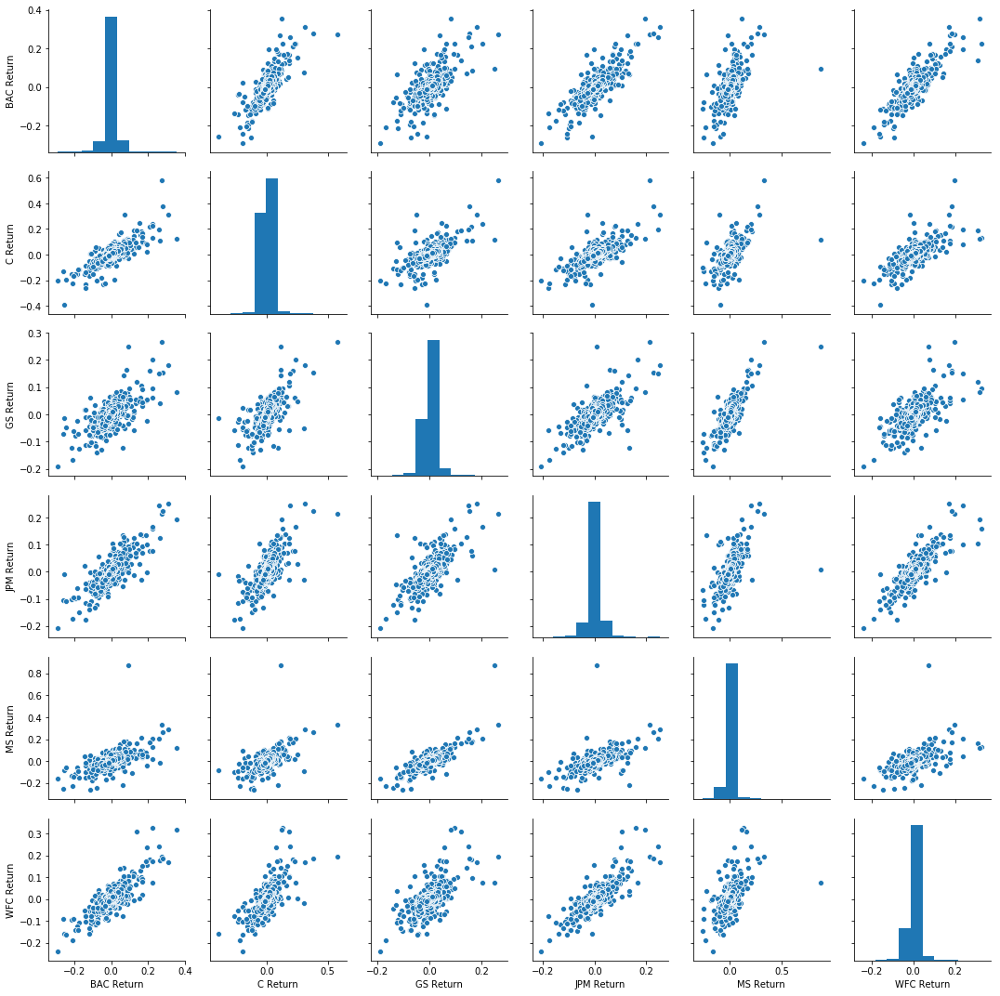

In [37]:
sns.pairplot(returns[1:])

** Using this returns DataFrame, figure out on what dates each bank stock had the best and worst single day returns. You should notice that 4 of the banks share the same day for the worst drop, did anything significant happen that day?**

In [38]:
returns.min()

BAC Return   -0.289694
C Return     -0.390244
GS Return    -0.189596
JPM Return   -0.207274
MS Return    -0.258929
WFC Return   -0.238223
dtype: float64

** You should have noticed that Citigroup's largest drop and biggest gain were very close to one another, did anythign significant happen in that time frame? **

* See Solution for details

In [39]:
returns.idxmin()

BAC Return   2009-01-20
C Return     2009-02-27
GS Return    2009-01-20
JPM Return   2009-01-20
MS Return    2008-10-09
WFC Return   2009-01-20
dtype: datetime64[ns]

** Take a look at the standard deviation of the returns, which stock would you classify as the riskiest over the entire time period? Which would you classify as the riskiest for the year 2015?**

In [40]:
returns.idxmax()

BAC Return   2009-04-09
C Return     2008-11-24
GS Return    2008-11-24
JPM Return   2009-01-21
MS Return    2008-10-13
WFC Return   2008-07-16
dtype: datetime64[ns]

In [41]:
returns.std()

BAC Return    0.036647
C Return      0.038672
GS Return     0.025390
JPM Return    0.027667
MS Return     0.037819
WFC Return    0.030238
dtype: float64

In [43]:
returns.ix['2015-01-01':'2015-12-31'].std()

c:\python 3.6.5\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


BAC Return    0.016163
C Return      0.015289
GS Return     0.014046
JPM Return    0.014017
MS Return     0.016249
WFC Return    0.012591
dtype: float64

** Create a distplot using seaborn of the 2015 returns for Morgan Stanley **

c:\python 3.6.5\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


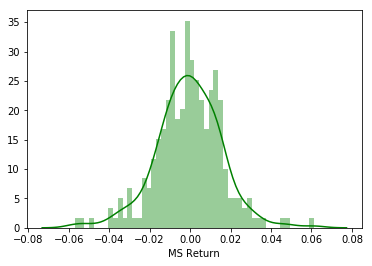

In [44]:
sns.distplot(returns.ix['2015-01-01':'2015-12-31']['MS Return'], color='green', bins=50)

** Create a distplot using seaborn of the 2008 returns for CitiGroup **

c:\python 3.6.5\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.


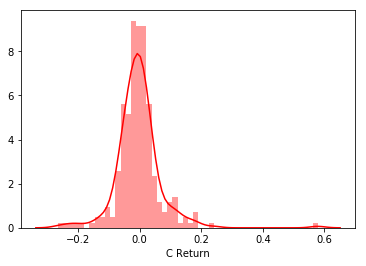

In [46]:
sns.distplot(returns.ix['2008-01-01':'2008-12-31']['C Return'], color='red', bins=50)

____
# More Visualization

A lot of this project will focus on visualizations. Feel free to use any of your preferred visualization libraries to try to recreate the described plots below, seaborn, matplotlib, plotly and cufflinks, or just pandas.

### Imports

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Optional Plotly Method Imports
import plotly
import cufflinks as cf
cf.go_offline()

** Create a line plot showing Close price for each bank for the entire index of time. (Hint: Try using a for loop, or use [.xs](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.xs.html) to get a cross section of the data.)**

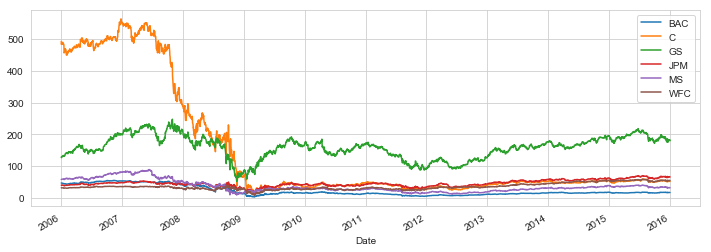

In [48]:
for tick in tickers:
    bank_stocks[tick]['Close'].plot(label=tick, figsize=(12,4))
plt.legend()

In [59]:
bank_stocks.xs(key='Close', axis=1, level='Stock Info').head()

Bank Ticker,BAC,C,GS,JPM,MS,WFC
Date,,,,,,
2006-01-03,47.080002,492.899994,128.869995,40.189999,58.310001,31.900000
2006-01-04,46.580002,483.799988,127.089996,39.619999,58.349998,31.530001
2006-01-05,46.639999,486.200012,127.040001,39.740002,58.509998,31.495001
2006-01-06,46.570000,486.200012,128.839996,40.020000,58.570000,31.680000
2006-01-09,46.599998,483.899994,130.389999,40.669998,59.189999,31.674999


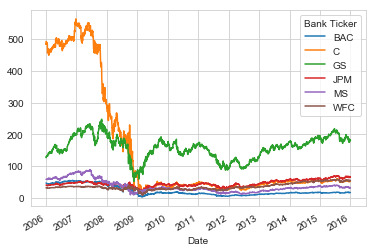

In [60]:
bank_stocks.xs(key='Close', axis=1, level='Stock Info').plot()

In [62]:
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot()

## Moving Averages

Let's analyze the moving averages for these stocks in the year 2008. 

** Plot the rolling 30 day average against the Close Price for Bank Of America's stock for the year 2008**

In [65]:
BAC.head()

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2006-01-03,47.180000,46.150002,46.919998,47.080002,16296700.0,36.332104
2006-01-04,47.240002,46.450001,47.000000,46.580002,17757900.0,35.946239
2006-01-05,46.830002,46.320000,46.580002,46.639999,14970700.0,35.992565
2006-01-06,46.910000,46.349998,46.799999,46.570000,12599800.0,35.938522
2006-01-09,46.970001,46.360001,46.720001,46.599998,15619400.0,35.961674


In [67]:

BAC['Close'].ix['2008-01-01':'2009-01-01'].rolling(window=30).mean()

c:\python 3.6.5\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated



Date
2008-01-02          NaN
2008-01-03          NaN
2008-01-04          NaN
2008-01-07          NaN
2008-01-08          NaN
2008-01-09          NaN
2008-01-10          NaN
2008-01-11          NaN
2008-01-14          NaN
2008-01-15          NaN
2008-01-16          NaN
2008-01-17          NaN
2008-01-18          NaN
2008-01-22          NaN
2008-01-23          NaN
2008-01-24          NaN
2008-01-25          NaN
2008-01-28          NaN
2008-01-29          NaN
2008-01-30          NaN
2008-01-31          NaN
2008-02-01          NaN
2008-02-04          NaN
2008-02-05          NaN
2008-02-06          NaN
2008-02-07          NaN
2008-02-08          NaN
2008-02-11          NaN
2008-02-12          NaN
2008-02-13    40.621667
                ...    
2008-11-18    21.352000
2008-11-19    21.050667
2008-11-20    20.771333
2008-11-21    20.458000
2008-11-24    20.184667
2008-11-25    19.793667
2008-11-26    19.514000
2008-11-28    19.247333
2008-12-01    18.901000
2008-12-02    18.566667
2008-12-03 

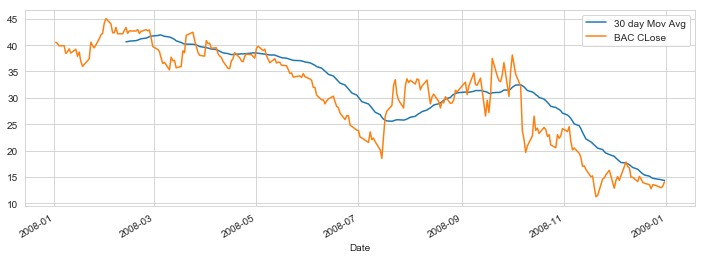

In [71]:
plt.figure(figsize=(12,4))
BAC['Close'].loc['2008-01-01':'2009-01-01'].rolling(window=30).mean().plot(label='30 day Mov Avg')
BAC['Close'].loc['2008-01-01':'2009-01-01'].plot(label='BAC CLose')
plt.legend()

** Create a heatmap of the correlation between the stocks Close Price.**

In [74]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').head()

Bank Ticker,BAC,C,GS,JPM,MS,WFC
Date,,,,,,
2006-01-03,47.080002,492.899994,128.869995,40.189999,58.310001,31.900000
2006-01-04,46.580002,483.799988,127.089996,39.619999,58.349998,31.530001
2006-01-05,46.639999,486.200012,127.040001,39.740002,58.509998,31.495001
2006-01-06,46.570000,486.200012,128.839996,40.020000,58.570000,31.680000
2006-01-09,46.599998,483.899994,130.389999,40.669998,59.189999,31.674999


In [78]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot(kind='box')

In [81]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot(kind='hist')

In [87]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot(kind='histogram')

In [89]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot(kind='barh')

In [90]:
#sns.heatmap()
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot(kind='area')

** Optional: Use seaborn's clustermap to cluster the correlations together:**

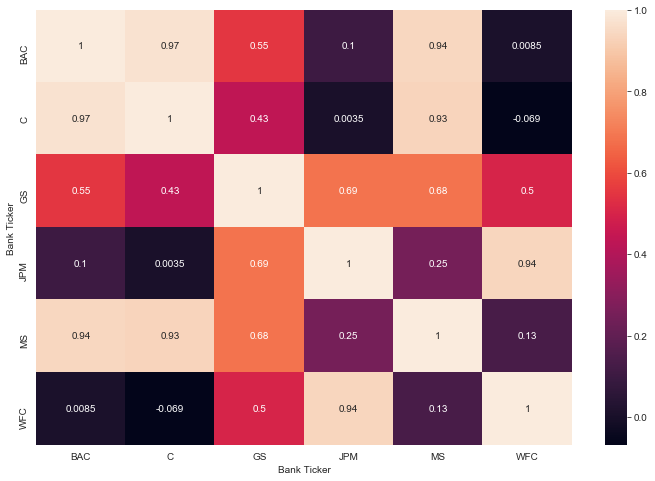

In [96]:
#sns.heatmap()
plt.figure(figsize=(12,8))
sns.heatmap(bank_stocks.xs(key='Close', axis=1, level='Stock Info').corr(), annot=True)

<Figure size 864x576 with 0 Axes>

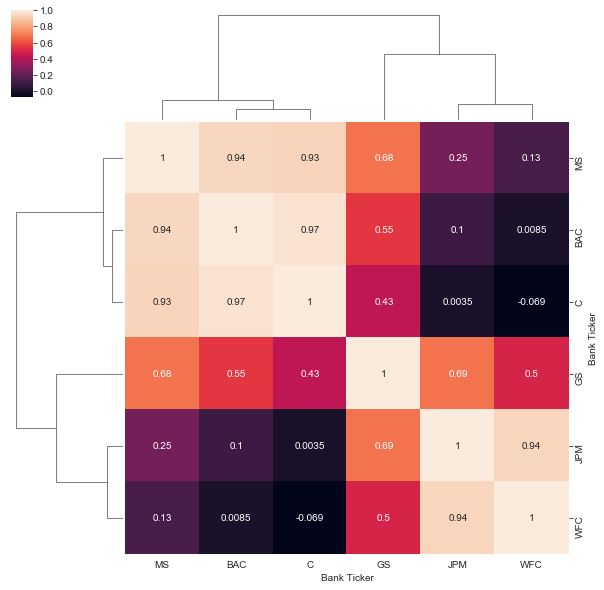

In [98]:
#sns.heatmap()
plt.figure(figsize=(12,8))
sns.clustermap(bank_stocks.xs(key='Close', axis=1, level='Stock Info').corr(), annot=True)

# Part 2 (Optional)

In this second part of the project we will rely on the cufflinks library to create some Technical Analysis plots. This part of the project is experimental due to its heavy reliance on the cuffinks project, so feel free to skip it if any functionality is broken in the future.

** Use .iplot(kind='candle) to create a candle plot of Bank of America's stock from Jan 1st 2015 to Jan 1st 2016.**

In [100]:
close_corr = bank_stocks.xs(key="Close", axis=1, level="Stock Info").corr()
close_corr


Bank Ticker,BAC,C,GS,JPM,MS,WFC
Bank Ticker,,,,,,
BAC,1.000000,0.971516,0.550898,0.103874,0.944218,0.008542
C,0.971516,1.000000,0.434123,0.003515,0.933609,-0.068536
GS,0.550898,0.434123,1.000000,0.685286,0.683792,0.499897
JPM,0.103874,0.003515,0.685286,1.000000,0.250427,0.940269
MS,0.944218,0.933609,0.683792,0.250427,1.000000,0.131835
WFC,0.008542,-0.068536,0.499897,0.940269,0.131835,1.000000


In [103]:
close_corr.iplot(kind='heatmap', colorscale='rdylbu')

** Use .ta_plot(study='sma') to create a Simple Moving Averages plot of Morgan Stanley for the year 2015.**

In [104]:
b = BAC[['Open','High','Low','Close']].loc['2015-01-01':'2016-01-01']
b.iplot(kind='candle')

**Use .ta_plot(study='boll') to create a Bollinger Band Plot for Bank of America for the year 2015.**

In [106]:
MS['Close'].loc['2015-01-01':'2016-01-01'].ta_plot(study='sma', periods=[13,15,22])

In [109]:
MS['Close'].loc['2015-01-01':'2016-01-01'].ta_plot(study='sma')

In [110]:
BAC['Close'].ix['2015-01-01':'2016-01-01'].ta_plot(study='boll')

c:\python 3.6.5\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated

